In [1]:
import pandas as pd
from scipy.stats import skew, kurtosis
import matplotlib.pyplot as plt
from datetime import timedelta
from polygon import RESTClient
import requests
from pandas.tseries.offsets import BDay

### 1. Collect data for the last 14 years - from 2010 to 2023 in daily granularity.
### 2. Identify top 10 outliers in each year.

In [2]:
def calculate_daily_returns(df, prev_close=None):
    if prev_close is not None:
        df.loc[df.index[0], 'prev_close'] = prev_close
    else:
        df['prev_close'] = df['c'].shift(1)
    df['daily_return'] = (df['c'] - df['prev_close']) / df['prev_close']
    df['abs_daily_return'] = df['daily_return'].abs()
    return df

def get_top_outliers(df, n=10):
    return df.nlargest(n, 'abs_daily_return')

# Define the API key and base URL
api_key = 'beBybSi8daPgsTp5yx5cHtHpYcrjp5Jq'

# Define the currency pairs and years
pair = "C:USDCHF"
years = range(2010, 2024)

# Initialize DataFrames
stats_data = pd.DataFrame(columns=['Year', 'Mean', 'Variance', 'Skewness', 'Kurtosis'])
full_data = pd.DataFrame()
outliers_data = pd.DataFrame()

# Loop over each year
for year in years:
	# Format the API endpoint
	start_date = f'{year}-01-01'
	end_date = f'{year}-12-31'
	url = f"https://api.polygon.io/v2/aggs/ticker/{pair}/range/1/day/{start_date}/{end_date}?adjusted=true&sort=asc&limit=50000&apiKey={api_key}"
	
	# Make the API request
	response = requests.get(url)
	data = response.json()
	
	# Check if the request was successful
	if response.status_code == 200 and 'results' in data:
		# Load data into a DataFrame
		df = pd.DataFrame(data['results'])
        # Converting timestamps
		df['date'] = pd.to_datetime(df['t'], unit='ms')
		df.drop(columns=['t'], inplace=True)
        # Calculating returns
		df = calculate_daily_returns(df)
        
		# Calculate basic statistical properties of the daily returns
		returns = df['daily_return'] 
		mean_return = returns.mean()
		variance_return = returns.var()
		skewness_return = skew(returns)
		kurtosis_return = kurtosis(returns)

		# Collect stats data by year
		year_stats = pd.DataFrame([[year, mean_return, variance_return, skewness_return, kurtosis_return]],
									columns=['Year', 'Mean', 'Variance', 'Skewness', 'Kurtosis'])
		stats_data = pd.concat([stats_data, year_stats], ignore_index=True)

		# Append the data to the full_data DataFrame for the current currency pair
		df['year'] = year
		full_data = pd.concat([full_data, df], ignore_index=True)

		# Find the top 10 outliers based on absolute values of the daily return value
		df['abs_daily_return'] = df['c'].abs()
		outliers = df.nlargest(10, 'abs_daily_return')

		# Append outliers to the outliers_data DataFrame for the current currency pair
		outliers['year'] = year
		outliers_data = pd.concat([outliers_data, outliers], ignore_index=True)

# Sort the data by date so that visualization could be done in a better way         
sorted_full_data = full_data.sort_values(by="date")
sorted_outliers_data = outliers_data.sort_values(by="date")

/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3047513548.py:56: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  stats_data = pd.concat([stats_data, year_stats], ignore_index=True)


In [3]:
sorted_full_data

,v,vw,o,c,h,l,n,date,prev_close,daily_return,abs_daily_return,year
0,2359,1.0351,1.036260,1.036040,1.036880,1.033780,2359,2010-01-03,NaN,NaN,NaN,2010
1,69913,1.0329,1.036060,1.028910,1.041960,1.026210,69913,2010-01-04,1.03604,-0.006882,0.006882,2010
2,76822,1.0304,1.029000,1.033410,1.035960,1.025150,76822,2010-01-05,1.02891,0.004374,0.004374,2010
3,81057,1.0321,1.033410,1.027460,1.037830,1.024800,81057,2010-01-06,1.03341,-0.005758,0.005758,2010
4,72488,1.0321,1.027440,1.033700,1.037050,1.024140,72488,2010-01-07,1.02746,0.006073,0.006073,2010
...,...,...,...,...,...,...,...,...,...,...,...,...
4449,112192,0.8555,0.856000,0.853720,0.857960,0.852800,112192,2023-12-26,0.85581,-0.002442,0.002442,2023
4450,174820,0.8495,0.853590,0.842500,0.854870,0.840600,174820,2023-12-27,0.85372,-0.013142,0.013142,2023
4451,196178,0.8392,0.842400,0.843370,0.845145,0.833000,196178,2023-12-28,0.84250,0.001033,0.001033,2023
4452,214081,0.8403,0.843460,0.840710,0.843560,0.835400,214081,2023-12-29,0.84337,-0.003154,0.003154,2023


In [4]:
sorted_outliers_data

,v,vw,o,c,h,l,n,date,prev_close,daily_return,abs_daily_return,year
3,116306,1.1565,1.15104,1.16024,1.16191,1.14913,116306,2010-05-24,1.151030,0.008002,1.16024,2010
7,176660,1.1625,1.16023,1.15739,1.16950,1.15178,176660,2010-05-25,1.160240,-0.002456,1.15739,2010
5,135028,1.1579,1.15739,1.15873,1.16230,1.15139,135028,2010-05-26,1.157390,0.001158,1.15873,2010
4,103597,1.1541,1.15223,1.15927,1.15929,1.14801,103597,2010-05-28,1.152140,0.006188,1.15927,2010
6,4795,1.1580,1.15828,1.15740,1.15920,1.15709,4795,2010-05-30,1.159270,-0.001613,1.15740,2010
...,...,...,...,...,...,...,...,...,...,...,...,...
137,168297,0.9389,0.94201,0.93949,0.94290,0.93480,168297,2023-03-01,0.941868,-0.002524,0.93949,2023
132,164385,0.9419,0.93950,0.94180,0.94400,0.93890,164385,2023-03-02,0.939490,0.002459,0.94180,2023
138,2794,0.9366,0.93590,0.93680,0.93698,0.93550,2794,2023-03-05,0.935854,0.001011,0.93680,2023
130,172706,0.9356,0.93069,0.94223,0.94260,0.92830,172706,2023-03-07,0.930550,0.012552,0.94223,2023


In [5]:
stats_data

,Year,Mean,Variance,Skewness,Kurtosis
0,2010,-0.000314,0.000038,NaN,NaN
1,2011,0.000070,0.000097,NaN,NaN
2,2012,-0.000074,0.000024,NaN,NaN
3,2013,-0.000060,0.000028,NaN,NaN
4,2014,0.000349,0.000015,NaN,NaN
5,2015,0.000075,0.000128,NaN,NaN
6,2016,0.000067,0.000020,NaN,NaN
7,2017,-0.000133,0.000015,NaN,NaN
8,2018,0.000036,0.000013,NaN,NaN
9,2019,-0.000068,0.000010,NaN,NaN


Skewness and Kurtosis (NaN): The NaN values likely indicate that daily returns for many years are very close to zero with little variance, thus not allowing for a meaningful calculation of skewness and kurtosis. This could mean the market is highly stable on a day-to-day basis, with changes being very subtle.

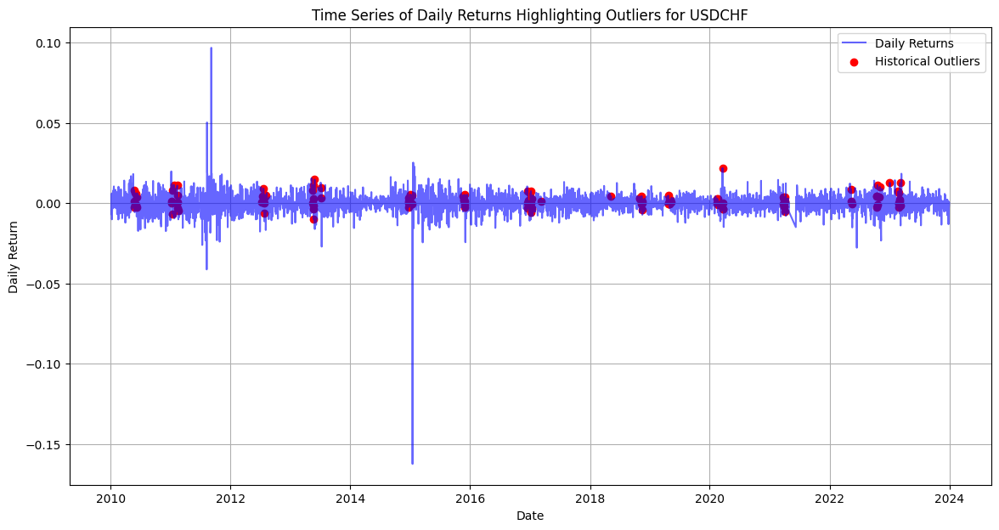

In [6]:
def plot_data_with_outliers(full_data, outliers_data):
    plt.figure(figsize=(14, 7))
    plt.plot(full_data['date'], full_data['daily_return'], label='Daily Returns', color='blue', alpha=0.6)
    plt.scatter(outliers_data['date'], outliers_data['daily_return'], color='red', label='Historical Outliers')
    plt.xlabel('Date')
    plt.ylabel('Daily Return')
    plt.title('Time Series of Daily Returns Highlighting Outliers for USDCHF')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot data with outliers
plot_data_with_outliers(sorted_full_data, outliers_data)

### 3. Collect data of 3 days prior and post for each of these outliers in hourly granularity.

In [7]:
# Convert dates in dataset to datetime objects
sorted_outliers_data['date'] = pd.to_datetime(sorted_outliers_data['date'])

date_ranges = pd.DataFrame({
    "start_date": sorted_outliers_data['date'] - BDay(3),
    "end_date": sorted_outliers_data['date'] + BDay(3),
    "outlier_date": sorted_outliers_data['date'],
    "year": sorted_outliers_data['year']
})

date_ranges

,start_date,end_date,outlier_date,year
3,2010-05-19,2010-05-27,2010-05-24,2010
7,2010-05-20,2010-05-28,2010-05-25,2010
5,2010-05-21,2010-05-31,2010-05-26,2010
4,2010-05-25,2010-06-02,2010-05-28,2010
6,2010-05-26,2010-06-02,2010-05-30,2010
...,...,...,...,...
137,2023-02-24,2023-03-06,2023-03-01,2023
132,2023-02-27,2023-03-07,2023-03-02,2023
138,2023-03-01,2023-03-08,2023-03-05,2023
130,2023-03-02,2023-03-10,2023-03-07,2023


In [8]:
import pandas as pd
import requests
from datetime import datetime, timedelta

def calculate_daily_returns(df, prev_close=None):
    if prev_close is not None:
        df.loc[df.index[0], 'prev_close'] = prev_close
    else:
        df['prev_close'] = df['c'].shift(1)
    df['returns'] = (df['c'] - df['prev_close']) / df['prev_close']
    return df

def fetch_hourly_data_chunk(symbol, start_date, end_date, api_key):
    formatted_start_date = start_date.strftime('%Y-%m-%d')
    formatted_end_date = end_date.strftime('%Y-%m-%d')

    url = f"https://api.polygon.io/v2/aggs/ticker/{symbol}/range/1/hour/{formatted_start_date}/{formatted_end_date}?apiKey={api_key}"
    response = requests.get(url)
    
    if response.status_code != 200:
        print(f"Failed to fetch data: {response.status_code} - {response.text}")
        return None
    
    response_data = response.json()
    
    if 'results' not in response_data:
        print(f"No 'results' in response: {response_data}")
        return None

    df = pd.DataFrame(response_data['results'])
    df['date'] = pd.to_datetime(df['t'], unit='ms')
    df.drop(columns=['t'], inplace=True)
    
    return df

def fetch_and_process_hourly_data(symbol, start_date, end_date, api_key):
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_colwidth', None)
    
    # Split the date range into smaller chunks
    chunk_size = 3  # Fetch data in 7-day chunks
    date_ranges = [(start_date + timedelta(days=i*chunk_size), 
                    min(end_date, start_date + timedelta(days=(i+1)*chunk_size - 1)))
                   for i in range((end_date - start_date).days // chunk_size + 1)]

    # print((end_date - start_date).days // chunk_size + 1)
    all_data = []

    for start, end in date_ranges:
        chunk_data = fetch_hourly_data_chunk(symbol, start, end, api_key)
        if chunk_data is not None:
            all_data.append(chunk_data)
    
    if not all_data:
        print("No data fetched")
        return None
    
    df = pd.concat(all_data)
    hourly_data = calculate_daily_returns(df)
    hourly_data.set_index('date', inplace=True)
    
    full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
    hourly_data = hourly_data.reindex(full_index)
    
    hourly_data.reset_index(inplace=True)
    hourly_data.rename(columns={'index': 'date'}, inplace=True)
    
    return hourly_data


In [9]:
# Initialize empty DataFrame
all_data = pd.DataFrame()

# Initialize an outlier identifier starting from 1 or any specific number
outlier_id = 1


for index, row in date_ranges.iterrows():
    # Convert start_date, end_date, and outlier_date to Timestamp for consistent comparison
    start_date_ts = pd.Timestamp(row['start_date'])
    end_date_ts = pd.Timestamp(row['end_date']) + pd.Timedelta(days=1)  # Extend the end date by one additional day
    outlier_date_ts = pd.Timestamp(row['outlier_date'])
    
    # Get hourly data for the range including 3 days before and after the outlier
    hourly_data = fetch_and_process_hourly_data(pair, start_date_ts, end_date_ts, api_key)
    # print(hourly_data)
    # Check if hourly_data is not None before processing
    if hourly_data is not None:
        # Assign the current outlier_id to the data
        hourly_data['outlier_id'] = outlier_id

        # Filter out weekdends
        hourly_data = hourly_data[~hourly_data['date'].dt.weekday.isin([5,6])]
        
        # prior_data from start_date to outlier_date inclusive
        prior_data = hourly_data[(hourly_data['date'] >= start_date_ts) & (hourly_data['date'] < outlier_date_ts)]
        prior_data["day type"] = "prior day"

        # outlier_data is for the hourly data on the day of the outlier
        outlier_data = hourly_data[(hourly_data['date'].dt.date == outlier_date_ts.date())]
        outlier_data["day type"] = "outlier day"

        # post_data = hourly_data[(hourly_data['date'] > outlier_date_ts) & (hourly_data['date'] < end_date_ts)]
        # post_data["day type"] = "post day"
        
        # post_data from the day after outlier_date to end_date
        post_outlier_ts = outlier_date_ts + pd.Timedelta(days=1)  # Starting the day after the outlier_date
        post_data = hourly_data[(hourly_data['date'] >= post_outlier_ts) & (hourly_data['date'] <= end_date_ts)]
        post_data["day type"] = "post day"
        # print(post_outlier_ts)
        # print(end_date_ts)
        # print(post_data)
        
        # Concatenate the data from this iteration to the cumulative DataFrame
        all_data = pd.concat([all_data, prior_data, outlier_data, post_data])

        # Increment the outlier_id for the next iteration
        outlier_id += 1

    else:
        print(f"Data not available for symbol {pair} from {row['start_date'].date()} to {row['end_date'].date()}")

# Add the day column to the final DataFrame
all_data['day'] = all_data['date'].dt.day_name()
# Optionally, you can reset the index of the final DataFrame if it becomes non-unique after concatenations
all_data.reset_index(drop=True, inplace=True)

/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '494cbf74a61925f7dbc2b09fd065fc4a'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '5e341ac190a877be7b8578114ae609e1'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'f0f1d5bfd41fe3052492fd7cc2478c7a'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '732ace3b164f3a7e1d1abe4ac1a6e48d'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '01558e244de042a384db2b3c8f637b1c'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '5e841ae7b6dde87ced76617812a4182c'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '58f4ae7100b01fc9118a957690f77656'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '25fdca994d226f0233803fe747957fbb'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'a9cfdf05a5d11920053c21e5ee3f27be'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'fb8c5552ecef93680de0d6e8762616e5'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '9399a341fe96dcf31e7aa35dc1b11f5e'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '1ec2aaaf0250c21dd11d90bffa478709'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'b5f038c3675893088022b3d6246734bb'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '43e7467ad3d939be16b0cafb90085ed9'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'c9bd4b964198d12569860fae61055e33'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'c18c8ad0deb95ab9c65966d3688d8c62'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '044cb5a7f6615f24fc2658669a8cb8b9'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '1410b318363a5c997cfb5e7ffa7cb1bd'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '4e15d33b7244ba46fd7d1c2bb7f70564'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'c0c236e8a219a2898a8c02a818526b7a'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': '9f3a57dd010ff557c6f11d8c82f26f43'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'd0b674b588bcadf8c1c4cf6ce7d41f8e'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

No 'results' in response: {'ticker': 'C:USDCHF', 'queryCount': 0, 'resultsCount': 0, 'adjusted': True, 'status': 'OK', 'request_id': 'ebfd21b0a4fe08302b3e4fb8a6121434'}


/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/3374083811.py:63: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(start=start_date, end=end_date + timedelta(days=1), freq='H')
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prior_data["day type"] = "prior day"
/var/folders/9n/nyfs9h7n2lsfs0vd2lq0589h0000gn/T/ipykernel_11787/1040331453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

In [10]:
all_data

,date,v,vw,o,c,h,l,n,prev_close,returns,outlier_id,day type,day
0,2010-05-19 00:00:00,9373.0,1.1507,1.152990,1.151130,1.153020,1.148990,9373.0,NaN,NaN,1,prior day,Wednesday
1,2010-05-19 01:00:00,6584.0,1.1502,1.151140,1.149380,1.152190,1.148460,6584.0,1.151130,-0.001520,1,prior day,Wednesday
2,2010-05-19 02:00:00,4968.0,1.1489,1.149390,1.147580,1.149720,1.147580,4968.0,1.149380,-0.001566,1,prior day,Wednesday
3,2010-05-19 03:00:00,6480.0,1.1476,1.147530,1.148930,1.149590,1.146480,6480.0,1.147580,0.001176,1,prior day,Wednesday
4,2010-05-19 04:00:00,4950.0,1.1487,1.148930,1.148750,1.149810,1.147760,4950.0,1.148930,-0.000157,1,prior day,Wednesday
5,2010-05-19 05:00:00,6427.0,1.1478,1.148730,1.148440,1.149350,1.146430,6427.0,1.148750,-0.000270,1,prior day,Wednesday
6,2010-05-19 06:00:00,11241.0,1.1490,1.148420,1.146800,1.151440,1.146700,11241.0,1.148440,-0.001428,1,prior day,Wednesday
7,2010-05-19 07:00:00,17967.0,1.1482,1.146810,1.148340,1.152860,1.145140,17967.0,1.146800,0.001343,1,prior day,Wednesday
8,2010-05-19 08:00:00,13049.0,1.1503,1.148340,1.150000,1.152030,1.148140,13049.0,1.148340,0.001446,1,prior day,Wednesday
9,2010-05-19 09:00:00,9866.0,1.1495,1.150000,1.149540,1.150960,1.148240,9866.0,1.150000,-0.000400,1,prior day,Wednesday


In [11]:
# # Reset the index to have simple numbers and separate "date" and "time" columns
# all_data1.reset_index(inplace=True)
# all_data1.rename(columns={'index': 'New'}, inplace=True)

# # Convert date to string format if necessary
# all_data1['date'] = all_data1['date'].astype(str)

# # Extract date and time from the date string
# all_data1['Date'] = all_data1['date'].str[:10]
# all_data1['Time'] = all_data1['date'].str[11:19]

# # Drop the 'date' column if it's no longer needed
# all_data1.drop(columns=['date', 'New', 'v'], inplace=True)

In [14]:
all_data.to_csv("USDCHF_hourly.csv")

In [13]:
# import datetime

# start_date_ts = datetime.date(2010, 5, 17)
# end_date_ts = datetime.date(2010, 5, 23)
# # outlier_date_ts = datetime.date(2010, 5, 26)

# hourly_data = fetch_and_process_hourly_data(pair, start_date_ts, end_date_ts, api_key)
# hourly_data.to_csv("/Users/nachiketkhare/Desktop/USDCHF_hourly_data.csv")

# print(hourly_data)


# # start_date_ts = datetime.date(2010, 5, 26)
# # end_date_ts = datetime.date(2010, 5, 30)
# # # outlier_date_ts = datetime.date(2010, 5, 26)

# # hourly_data = fetch_and_process_hourly_data(pair, start_date_ts, end_date_ts, api_key)
# # hourly_data.to_csv("/Users/nachiketkhare/Desktop/USDCHF_hourly_data.csv")

# # print(hourly_data)
# # if hourly_data is not None:
#         # # Assign the current outlier_id to the data
#         # hourly_data['outlier_id'] = outlier_id

#         # # Filter out weekdends
#         # # hourly_data = hourly_data[~hourly_data['date'].dt.weekday.isin([5,6])]
    
#         # # prior_data from start_date to outlier_date inclusive
#         # prior_data = hourly_data[(hourly_data['date'].dt.date >= start_date_ts) & (hourly_data['date'].dt.date < outlier_date_ts)]
#         # prior_data["day type"] = "prior day"
#         # # print(prior_data)
#         # # # outlier_data is for the hourly data on the day of the outlier
#         # # outlier_data = hourly_data[(hourly_data['date'].dt.date == outlier_date_ts.date())]
#         # # outlier_data["day type"] = "outlier day"

#         # # post_data = hourly_data[(hourly_data['date'] > outlier_date_ts) & (hourly_data['date'] < end_date_ts)]
#         # # post_data["day type"] = "post day"
        
#         # # post_data from the day after outlier_date to end_date
#         # post_outlier_ts = outlier_date_ts + pd.Timedelta(days=1)  # Starting the day after the outlier_date
#         # post_data = hourly_data[(hourly_data['date'].dt.date > outlier_date_ts) & (hourly_data['date'].dt.date <= end_date_ts)]
#         # post_data["day type"] = "post day"
    
#         # print(post_data['date'].dt.date.unique())
#         # print(post_outlier_ts)
#         # print(end_date_ts)
#         # print(post_data)